## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Computation of the camera calibration using chessboard images

First we need to calibrate the camera using chess board images taken by the same camera.Chessboard is great for calibration because it's regular high contrass pattern makes it easy to detec automaticly. 

Some of the objects in the images especially ones near the edges can get stretched or skewed in various ways thus we need to calibrate the camera first to deal with those problems. 

### Types of Distortion

Real cameras use curved lenses to form an image, and light rays often bend a little too much or too little at the edges of these lenses. This creates an effect that distorts the edges of images, so that lines or objects appear more or less curved than they actually are. This is called **radial distortion**, and it’s the most common type of distortion.

Another type of distortion, is **tangential distortion**. This occurs when a camera’s lens is not aligned perfectly parallel to the imaging plane, where the camera film or sensor is. This makes an image look tilted so that some objects appear farther away or closer than they actually are.

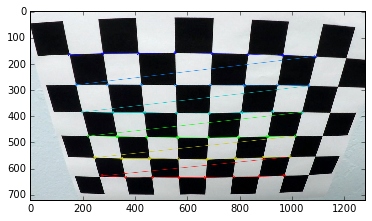

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# prepare object points
nx = 8
ny = 6

# Make a list of calibration images
fname = 'camera_cal/calibration2.jpg'
img = cv2.imread(fname)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)
    plt.show()

There are two main steps to this process: use chessboard images to image points and object points, and then use the OpenCV functions **cv2.calibrateCamera()** and **cv2.undistort()** to compute the calibration and undistortion.

    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
    # Do camera calibration given object points and image points 
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    # undistort image 
    dst = cv2.undistort(img, mtx, dist, None, mtx)

Calibration is also imporant to calculate the lane curvature and car positon correctly.You can find the camaera calibration codes in the **Camera.py**. The Camera class expects the path of the calibration images (chess board images). **Camera** class **undistort** methods is used for calibrating the new images. First it calls **calibrate** method if the calibration matrix has't calculated yet it also checks if there is already saved data on the disk for the calibration parameters (mtx, dst) according to the image size. For calibrating the camera we go through the all calibration images and find the object and image points by using **OpenCV findChessboardCorners** method. After that we use the **OpenCV calibrateCamera** function with the found object and image points to calculate camera calibration and distortion coefficients. I applied this distortion correction to the test image using the cv2.undistort() function. You can see an example of camera calibration with one of the calibration image. 

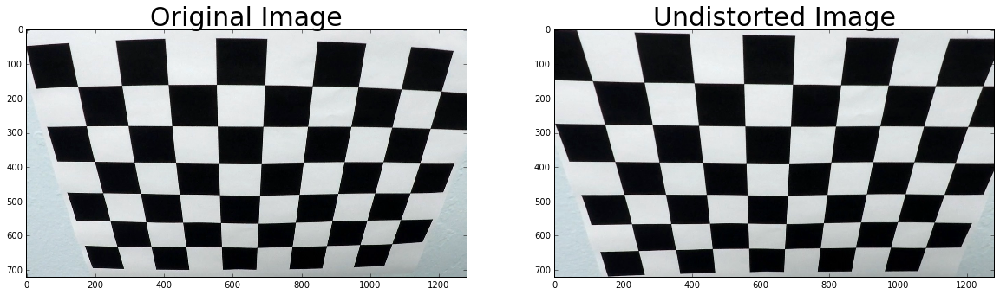

In [1]:
from Camera import Camera
import matplotlib.pyplot as plt
import cv2
calibration_path = 'camera_cal'
camera  = Camera(calibration_path)
# Test undistortion on an raw calibration image


img = cv2.imread('camera_cal/calibration2.jpg')
dst = camera.undistort(img)
cv2.imwrite('output_images/test_undist.jpg',dst)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
plt.show()

## Undistortion Example

In the cell bellow there is an example of camera calibration with one of the test image taken from the car camera. 

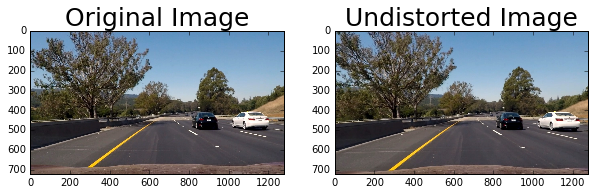

In [44]:
#Test undistortion on an test image
img = plt.imread('test_images/test6.jpg')
figsize=(10,5)
dst = camera.undistort(img)

#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=25)
plt.show()

## Perspective Tranform
Applying the **perpective transform** is really usefull because finding the curvature of a lane are easer to perfom on a **bird's eye** view of an image. 

---

<figure>
 <img src="output_images/lanes_before_pt.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Left lane is leaning to the right while right lane is leaning to the left. </p> 
 </figcaption>
</figure>
Perpective trasnfor is like camera calibration, however instead of mapping object points sto image points we will map the points in a given image to different desired image with a new perspective. 

    1)Compute the perspective transform, M, given source and destination points:
    M = cv2.getPerspectiveTransform(src, dst)
    
    2)Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    3)Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    4)warp back to original perspective
    cv2.warpPerspective(im, Minv, img_size, flags=cv2.INTER_LINEAR)


In the masked image above there are a lots of pixels seen other than lanes.In order to clear them we need to apply perspective transform to get interested area on the image.Thus  transforming the image to another view (bird's eye view) is important to find lane lines and caculate the properties easily. For that pupose we implemented ** PerspectiveTransform ** class on **PerspectiveTransform.py**. It uses pre defined source and destination points (see bellow)  and calculates the transformation and invers transformation matrixes by using *cv2.getPerspectiveTransform()* method. With the calculated matrixes we can transform a given image to specified perspective by using **cv2.warpPerspective()** method. In the cell bellow there is an example of perpective transform to birdseye view with one of the test image. 
 
     - hard coded source and destination points
         src = np.float32([(130, 700), (540, 470), (740, 470), (1150, 700)])
         dst = np.float32([(330, 720), (330, 0), (950, 0), (950, 720)])

- Undistort the image using cv2.undistort() with mtx and dist
- Convert to grayscale
- Find the chessboard corners
- Draw corners
- Define 4 source points (the outer 4 corners detected in the chessboard pattern)
- Define 4 destination points (must be listed in the same order as src points!)
- Use cv2.getPerspectiveTransform() to get M, the transform matrix
- use cv2.warpPerspective() to apply M and warp your image to a top-down view  

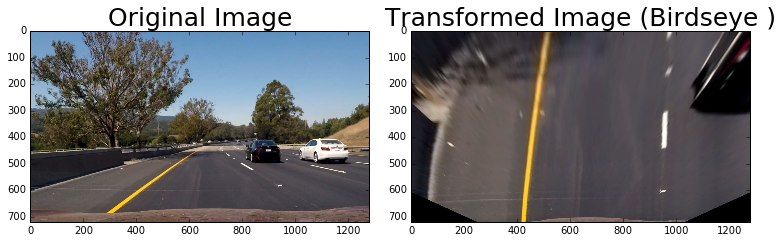

In [45]:
from PerspectiveTransform import PerspectiveTransform
perspectiveTransformer = PerspectiveTransform()
img = plt.imread('test_images/test6.jpg')

undistorted_image = camera.undistort(img)
transformed_image = perspectiveTransformer.get_perpective_transform(undistorted_image)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
f.tight_layout()
ax1.imshow(img,cmap='gray')
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(transformed_image, cmap='gray')
ax2.set_title('Transformed Image (Birdseye )', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Thresholded Binary Image
### Gredient Threshold


Applying the Sobel operator to an image is a way of taking the derivative of the image in the x or y direction.

---
<figure>
 <img src="output_images/soble-operator.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Sobel operators. </p> 
 </figcaption>
</figure>

To understand how these operators take the derivative, we can think of overlaying either one on a 3 x 3 region of an image. If the image is flat across that region, then the result (summing the element-wise product of the operator and corresponding image pixels) will be zero. If, instead, for example, you apply the Sx  operator to a region of the image where values are rising from left to right, then the result will be positive, implying a positive derivative.

### x vs. y
In the bellow images, we can see that the gradients taken in both the x and the y directions detect the lane lines and pick up other edges. Taking the gradient in the x direction emphasizes edges closer to vertical. Alternatively, taking the gradient in the y direction emphasizes edges closer to horizontal.


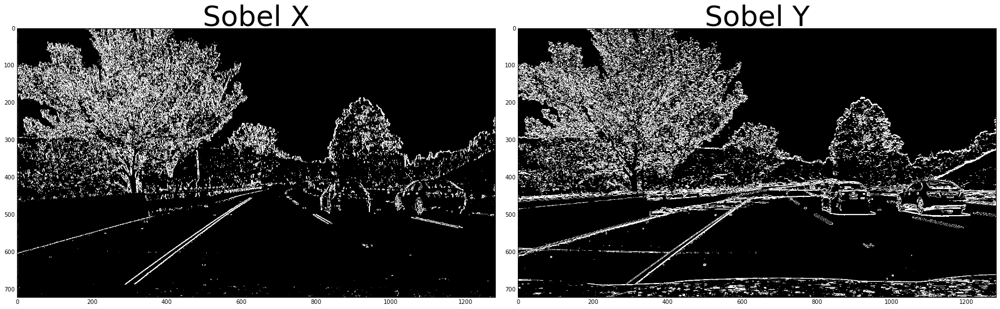

In [46]:
# function to apply Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    #plt.imshow(sbinary, cmap='gray')
    # 6) Return this mask as your binary_output image
    return sbinary

image = plt.imread('test_images/test6.jpg')
# Run the function
sobel_x = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
sobel_y = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(sobel_x,cmap='gray')
ax1.set_title('Sobel X', fontsize=50)
ax2.imshow(sobel_y, cmap='gray')
ax2.set_title('Sobel Y', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### Magnitude of the Gradient
We can see that the x-gradient does a cleaner job of picking up the lane lines, but also we can see the lines in the y-gradient as well. Therefore we can also apply a threshold to the overall magnitude of the gradient, in both **x ** and **y**.The magnitude, or absolute value, of the gradient is just the square root of the squares of the individual x and y gradients. For a gradient in both the x and y directions, the magnitude is the square root of the sum of the squares.



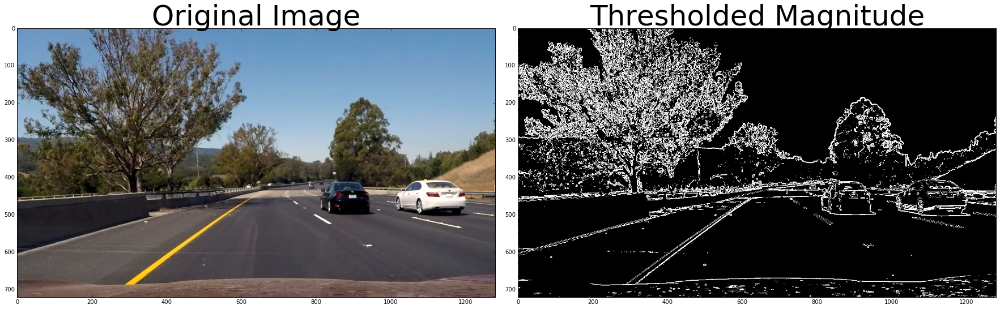

In [55]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in an image
image = plt.imread('test_images/test6.jpg')

# Funtion to apply Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # 6) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # 7) Return this mask as your binary_output image
    return binary_output
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### Color Thresholding 
The road images we have seen so far has 3 different color channels **RGB** (red-green-blue). However RGB thresholding doesn't work that well in images that include varying light conditions or when lanes are differnt color like yellow.

On the other hand there are other color spaces which is commonly used for image processing like **HLS** space (hue, lightness, and saturation). **HLS** color space isolates the lightness **(L)** component, which varies the most under different light conditions. **H** and **S** channels stay fairly consistent in shadow or excessive brightness. 


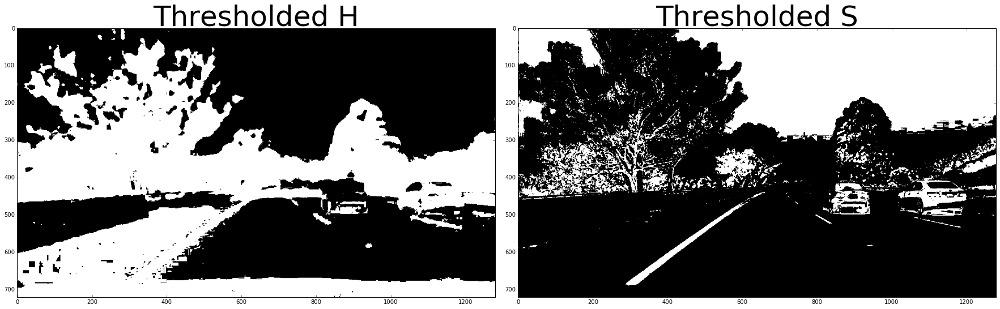

In [62]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2



# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select_S(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

# Define a function that thresholds the H-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select_H(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    # 2) Apply a threshold to the S channel
    binary_output = np.ones_like(H)
    binary_output[(H > thresh[0]) & (H <= thresh[1])] = 0
    # 3) Return a binary image of threshold result
    return binary_output

# Read in an image
image = plt.imread('test_images/test6.jpg')

s_binary = hls_select_S(image, thresh=(90, 255))
h_binary = hls_select_H(image, thresh=(90, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(h_binary, cmap='gray')
ax1.set_title('Thresholded H', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### Combined Thresholding
In the cell bellow there is an example of masking image to mask lane lines. In order to create the binary image to mask the lane information several image processing teqniues were tested and combined. In the **ImageProcesing.py** you can find the several methods to create maksed image for the lanes. We tested direction thresholding on x and y magnitude thresholding with different parameters. In the end we used a combination of sobel threshold on x direction and HLS color space threshold. First the image is converted to the grey scale before calculation of the gradient. Then we used  **cv2.Sobel()** method on x direction only to calculate the gradient and masked the image by only accepting the values between 30 and 150. Also image is converted to the **HLS** color space and pixels selected if the S channel value is between 175 and 250. After that bitwise or operation is applied to the masked images. (sobelx and extracred S). ** In ImageProcesing.py combined_threshold  ** method is used to create the thresholded binary image and you can find an example of it on the cell bellow. 
    
    def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
        if orient == 'y':
            sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1)
        else:
            sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0)
        # 3) Take the absolute value of the derivative or gradient
        abs_sobel = np.absolute(sobel)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
        # 5) Create a mask of 1's where the scaled gradient magnitude
        # is > thresh_min and < thresh_max
        sbinary = np.zeros_like(scaled_sobel)
        sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        # plt.imshow(sbinary, cmap='gray')
        # 6) Return this mask as your binary_output image
        return sbinary

    def SThreshold(img, thresh=(0, 255)):
        # apply thresholding
        s_thresh = cv2.inRange(convert2S(img).astype('uint8'), thresh[0], thresh[1])
        s_binary = np.zeros_like(s_thresh)
        s_binary[(s_thresh == 255)] = 1
        return s_binary

    def combined_threshold(image):
        ksize = 3  # Choose a larger odd number to smooth gradient measurements
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        gradx = abs_sobel_thresh(gray, orient='x', thresh=(30, 150))
        sbinary = SThreshold(image, thresh=(175, 250))
        combined = np.zeros_like(gradx)
        combined[(gradx == 1) | (sbinary == 1)] = 1
        return combined 
    

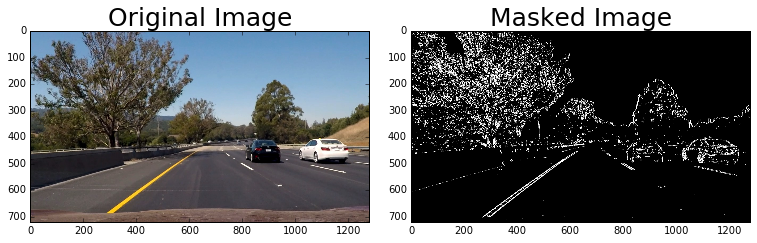

In [33]:
from ImageProcesing import combined_threshold

img = plt.imread('test_images/test6.jpg')

undistorted_image = camera.undistort(img)
combined_image = combined_threshold(undistorted_image)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
f.tight_layout()
ax1.imshow(img,cmap='gray')
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(combined_image, cmap='gray')
ax2.set_title('Masked Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In the cell bellow you can see and example of output of implemented teqnies so far (camera calibration, perspective trasnfor and lane masking). As seen on the left image still is not perfecly masked there are some noise and non lanes pixels we will deal with that with the Lane detector module to detect only the lanes and put it on the image.  

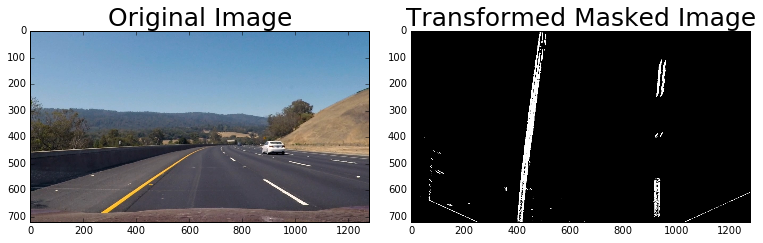

In [70]:
img = plt.imread('test_images/test3.jpg')

undistorted_image = camera.undistort(img)
perspectiveTransformer = PerspectiveTransform()
transformed_image = perspectiveTransformer.get_perpective_transform(undistorted_image)
combined_image = combined_threshold(transformed_image)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
f.tight_layout()
ax1.imshow(img,cmap='gray')
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(combined_image, cmap='gray')
ax2.set_title('Transformed Masked Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Locate the Lane Lines and Fit a Polynomial

Now we have a thresholded warped image and we can map out the lane lines. 

### Line Finding Method: Peaks in a Histogram
After applying calibration, thresholding, and a perspective transform to a road image, we have a binary image where the lane lines stand out clearly. However, we still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.

Thus first we need to take a **histogram** along all the columns in the lower half of the image like this:

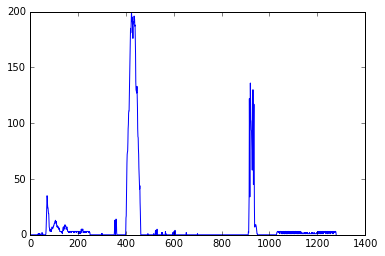

In [72]:
import numpy as np

histogram = np.sum(combined_image[combined_image.shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.show()

### Sliding Window
With this histogram we are adding up the pixel values along each column in the image. In our thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. Therefore we can use that as a starting point for where to search for the lines. From that point, we can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.

/home/burak/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


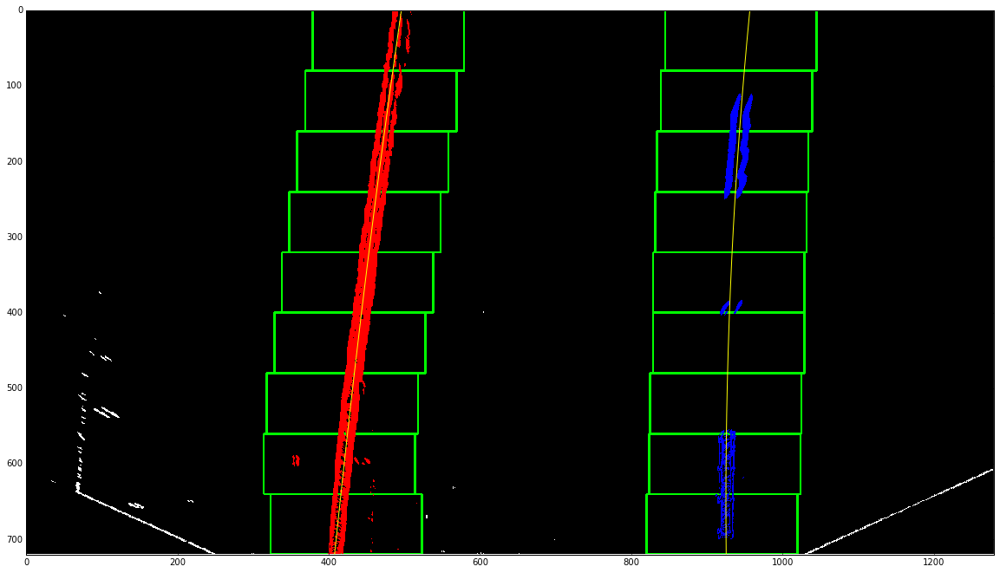

In [85]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assuming you have created a warped binary image called "combined_image"
# Take a histogram of the bottom half of the image
histogram = np.sum(combined_image[combined_image.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((combined_image, combined_image, combined_image))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(combined_image.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = combined_image.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = combined_image.shape[0] - (window+1)*window_height
    win_y_high = combined_image.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

## Visualization 

# Generate x and y values for plotting
ploty = np.linspace(0, combined_image.shape[0]-1, combined_image.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

fig1 = plt.figure(figsize = (20,20)) # create a 20x 20 figure 
ax3 = fig1.add_subplot(111)
ax3.imshow(out_img, interpolation='none')

ax3.plot(left_fitx, ploty, color='yellow')
ax3.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()


### Lane.py 
We implemented two class for the lane detection. The **Lane** class (on **Lane.py**) is implemented to represent lanes. It has several attributes for lane parameters. It calculates the lane polynome (**current_fit**) by given x and y points. Also it keeps track of the previously found lane parameters to generate better results (it calculates the **best_fit** by using the old lane parametes up to 10 previuos frames.) (smoorthing etc.). It also has methods to check and compare the lanes. 
### LaneDetector.py 
**LaneDetector** class has the processing and searrch methods. In the init method of LaneDetector class first we calculate the Camera calibration and transformation matrixes. First the **process_image** method is callled there the image is undistorted and pass to **detect_lanes** method. On the **detect_lanes** method first we apply **combined_threshold** then transformed it to get binary warped image to strart searching for the lanes. Then we cut the image half on the x axis to search left and right lane seperately. We implemented two methods to search for the lanes the first one is  **histogram_search** and the second one is **search_along_previous_lane**. 

##### histogram_search ( LaneDetector.py  line 193-260)
First we cut the  image (we pass left and right halves then cut the half by two on the y axis so acctually we create the histogram of the quarter of the original image.) on y axsis and create the histogram. Then we can use the point where the histogram has peak for the starting point of the sliding window search from top the bottom of the image. You can see the found windows and points on for the left (red points) and the right lanes. 

---

<figure>
 <img src="output_images/left_lane_windows.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Sliding windows of the histogram_search for the left lane. </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="output_images/right_lane_windows.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Sliding windows of the histogram_search for the right lane. </p> 
 </figcaption>
</figure>

histogram_search method can detect the lanes fairly well however it takes around 5 seconds to make the search. 5 secodns is not acceptable for the real time purposes. Thus we implemented second search method to speed up the process. 

##### search_along_previous_lane  ( LaneDetector.py  line 263-292)
After detecting the lanes in the previous frame we don't need to do search blindly as the lanes location don't change a lot from one frame to another, for that purpose we use **search_along_previous_lane** method. It uses the lanes found in the previous frame and make do the search near them (with a margin equals 100). 

##### detect_lanes  ( LaneDetector.py  line 95-137)
This method checks the previosly found lanes to decide which search method will be used. If the system can found the lanes and validated them according to their parameters (see the **validate_lane** method) the **search_along_previous_lane** will be used to locate the lanes otherwise system will start the **histogram_search** to do the complete search again. After the search **draw_lanes** is called to paint the lanes area and **draw_lanes_info** to print the lanes info (radius, distance from the center and x locations). 

##### validate_lane  ( LaneDetector.py  line 139-177)
It check whether the found lanes is make sense by first comparing them to each other. For that first we calculated the new lane polynoms and we check the first and second coefficients of the polynomes to decide if they are parallel (** is_parallel in Lane.py line 68-75**).Also we calculate the distance between the lanes by using **calculate_distance (Lane.py line 77-83)** . If the lanes are parellel and the distance is in between thresholds than we said that the both lanes are ok and return. Otherwise we compare teh left and the right lane by the previous coefficinets and validate them seperately. (That means we can validate only one lane and not the other one on a frame). 

##### draw_lanes  ( LaneDetector.py  line 55-92)
It uses the best fit polynomial of the found lanes and creates points along the y axis. Then it uses **cv2.fillPoly** method to fill the lane area. We also  draw lines (red lines for the left and blue for the right) on the lanes by using **cv2.polylines** method. After drawing on the warped image we use ** get_reverse_transform** method of the **PerspectiveTransform** to get lanes overlay on the original shape. finaly we add the lane overlay to the original image by using **cv2.addWeighted** method. 


##### draw_lanes_info  ( LaneDetector.py  line 31-53)
This method prints the lane information on to frame. You can see the disnance from the center on the center above and left and right lanes informations (radius and the position) on the left and right bottom respectively.It uses **calculate_radius** method of the **Lane** class to calculate the lanes radius. We use the lanes base coordinates the calculate the distance from the center.First we calculate the lane center in pixel values by simply adding the left and rigth x coordinate and divide it by two. Than we compare it the center of the image then we convert the distance from thecenter from pixel values to real world value. 

        center = image.shape[1] / 2
        lane_center = self.right_line.line_base_pos - self.left_line.line_base_pos
        center_x = (lane_center / 2.0) + self.left_line.line_base_pos
        cm_per_pixel = 370.0 / lane_center  # US regulation lane width = 3.7m
        dist_from_center = (center_x - center) * cm_per_pixel


##### calculate_radius  ( Lane.py  line 85-108)
We use the conversion bellow to calculate the real radius of the lanes. On this project we make calculations all in pixel coordinates and it is different than the real life. thus we define a converion parameters to convert the pixel values in real life information. After that we compute the second order polynomial of the lanes in meters. Lets say 

        - f(y) = Ax^2+Bx+C 
        
is the second order polynome of the found lane. We can calculate the radius by simply using first and the second order derivatives of the curve. 
        
 <figure>
 <img src="output_images/Rcurve.png" width="180" alt="Raius Formula" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> The radius of curvature of the function x=f(y) </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>

The first and the secod order derivatives of the function f(y) = Ax^2+Bx+C is. 

 <figure>
 <img src="output_images/derivates.png" width="180" alt="Derivates" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> f'(y) and f''(y)  </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>

In the end the radius of the polynome f(y) become :

 <figure>
 <img src="output_images/final_formula.png" width="180" alt="Derivates" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Radius formula of f(y). </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>

        #Define conversions in x and y from pixels space to meters
        ym_per_pix = 30 / 720  # meters per pixel in y dimension
        xm_per_pix = 3.7 / 700  # meters per pixel in x dimension




### Lane Detection on Test Images
You can see the output of the pipeline on the cell bellow. 

/home/burak/git-ws/CarND-Advanced-Lane-Lines/LaneDetector.py:198: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  histogram = np.sum(half[half.shape[0] / 2:, :], axis=0)


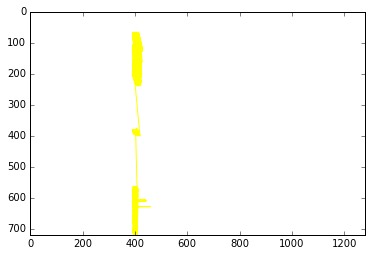

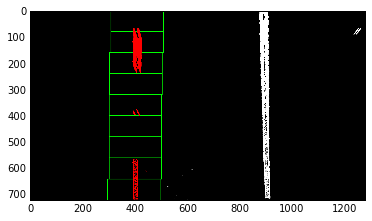

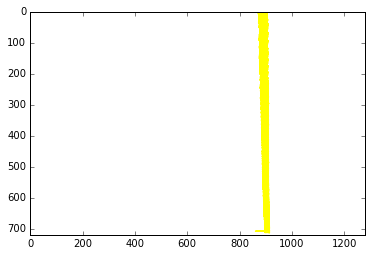

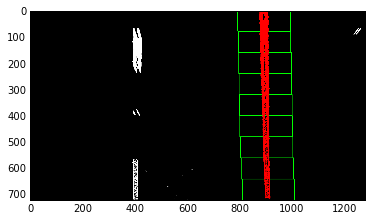

image_path :  test_images/straight_lines2.jpg
6.5 procesing time 


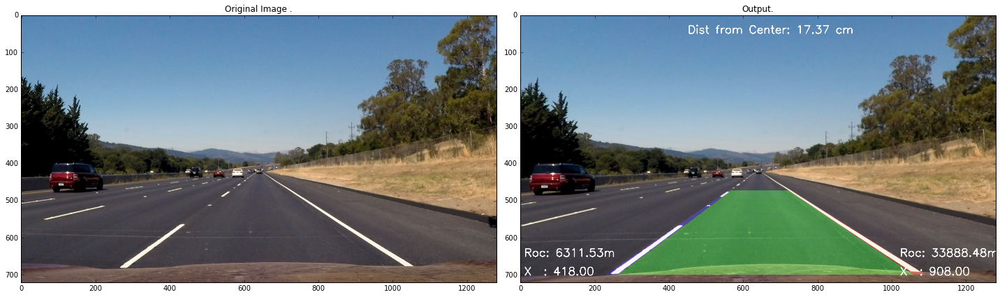

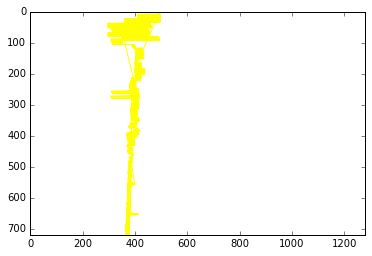

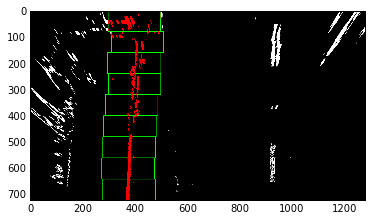

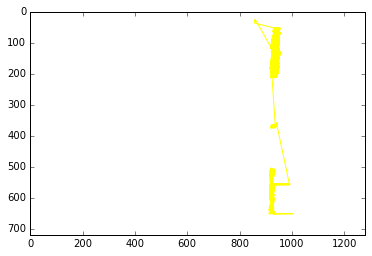

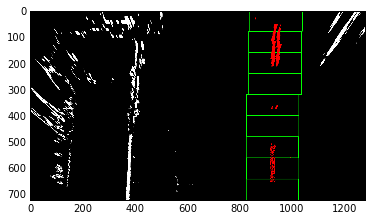

image_path :  test_images/test5.jpg
6.19 procesing time 


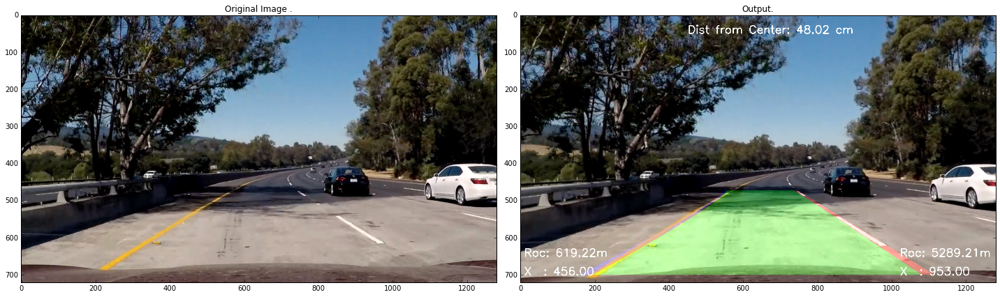

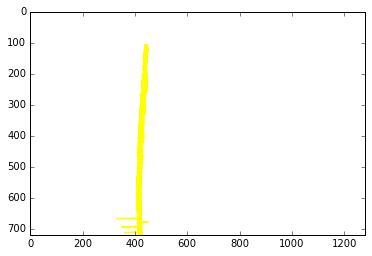

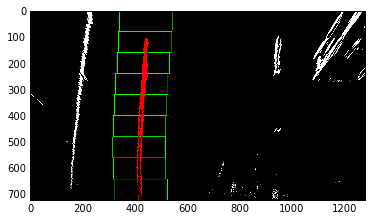

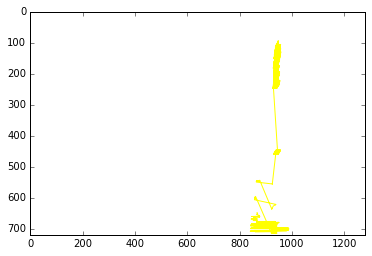

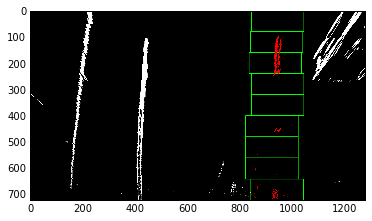

image_path :  test_images/test1.jpg
6.64 procesing time 


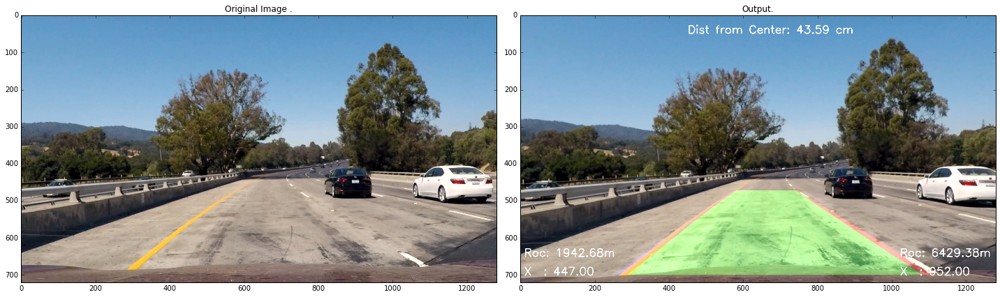

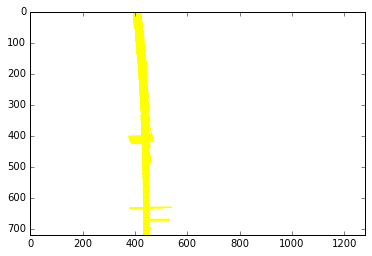

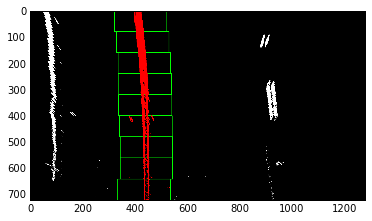

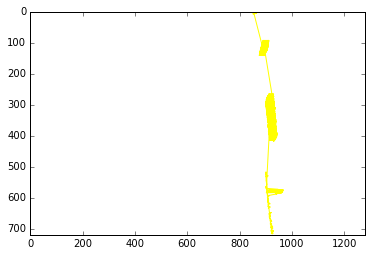

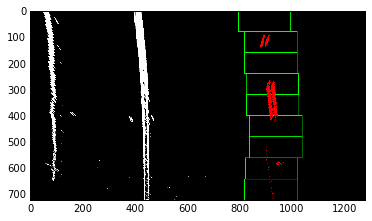

image_path :  test_images/test2.jpg
6.43 procesing time 


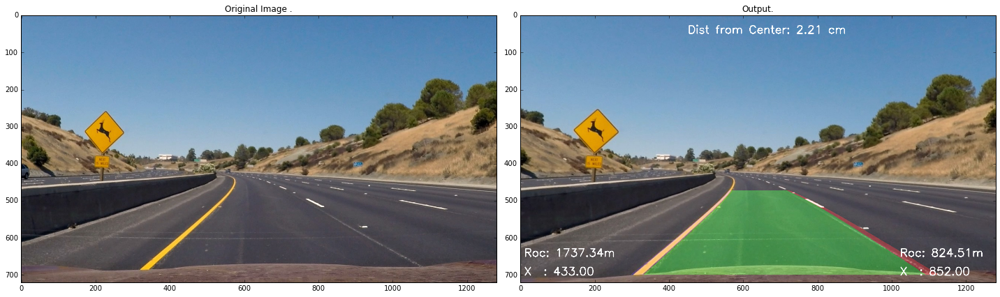

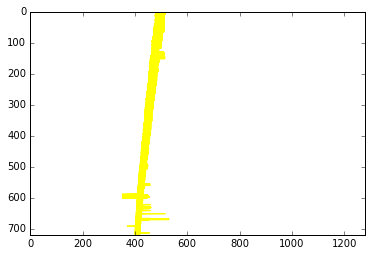

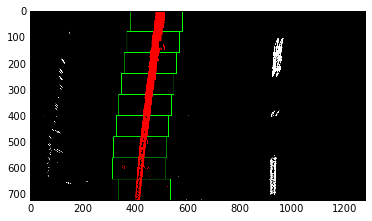

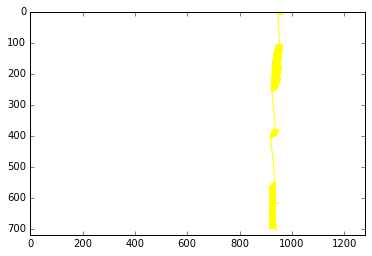

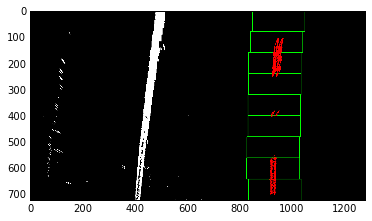

image_path :  test_images/test3.jpg
6.37 procesing time 


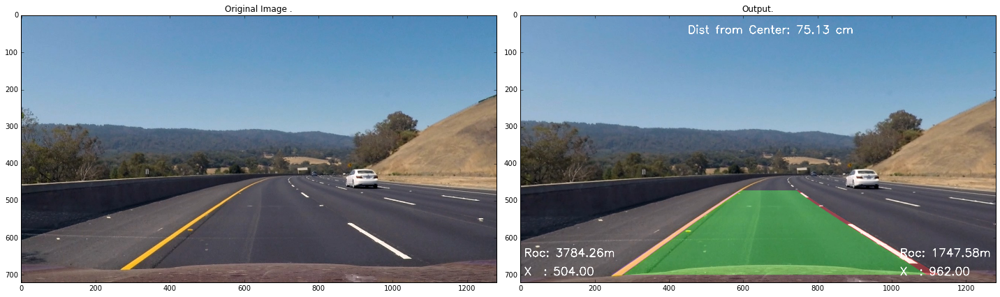

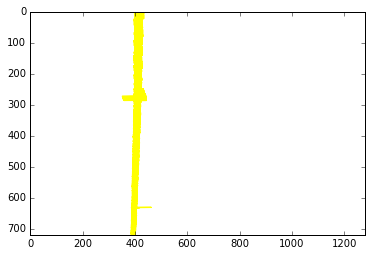

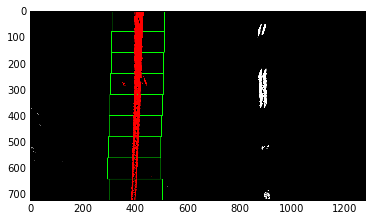

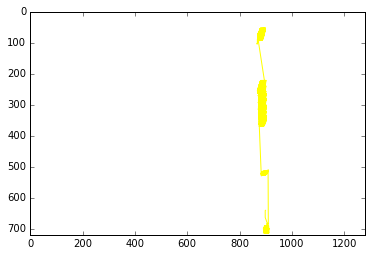

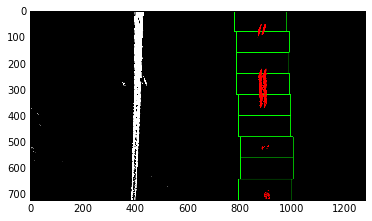

image_path :  test_images/straight_lines1.jpg
6.24 procesing time 


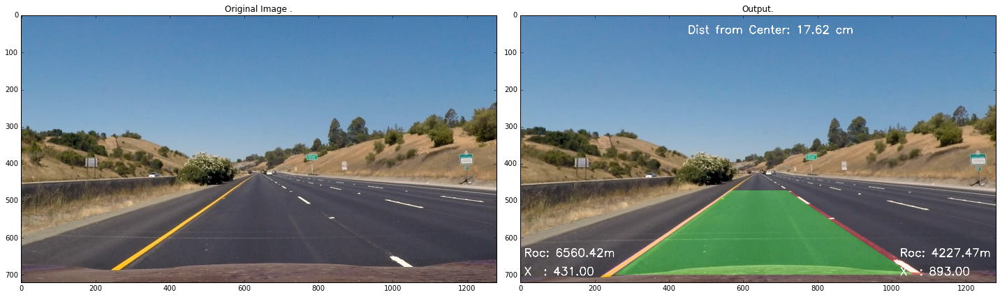

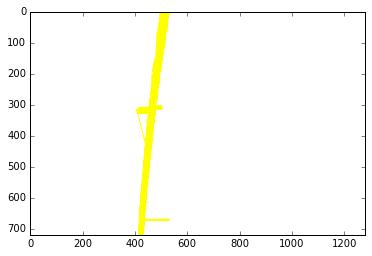

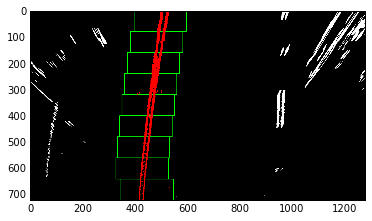

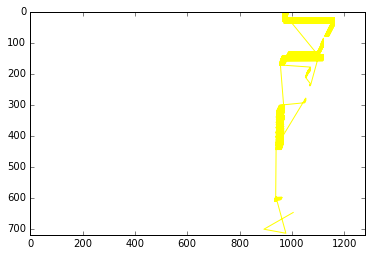

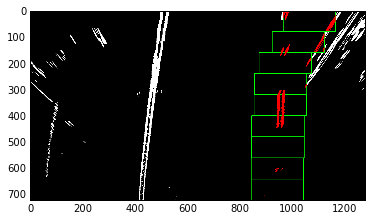

image_path :  test_images/test6.jpg
6.2 procesing time 


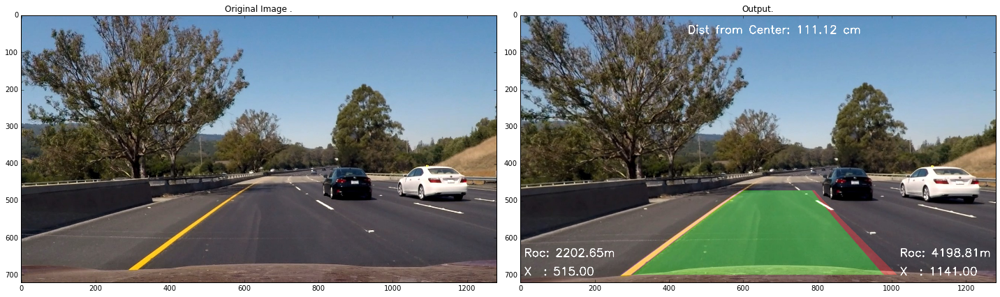

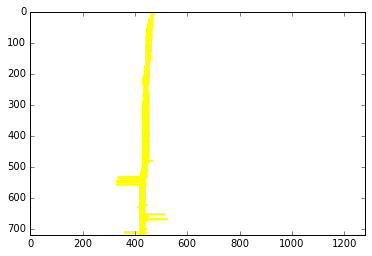

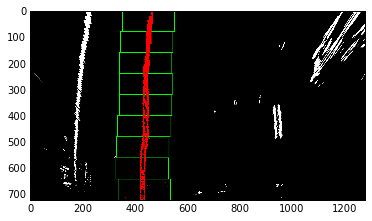

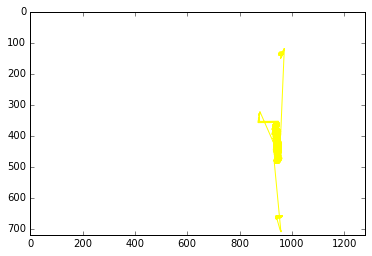

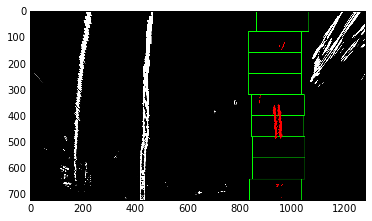

image_path :  test_images/test4.jpg
6.15 procesing time 


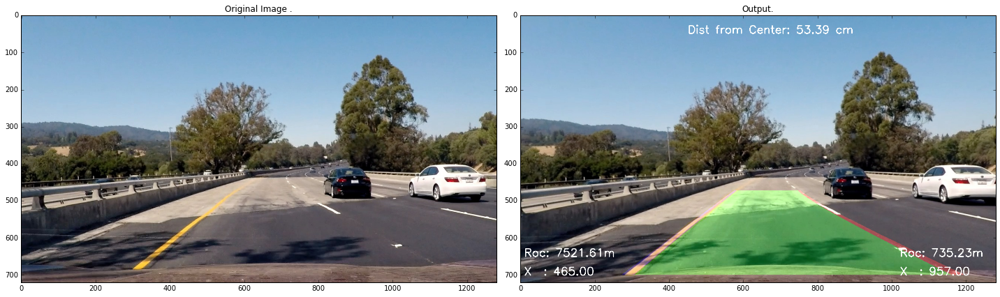

In [3]:
import glob
import time
from LaneDetector import LaneDetector
from Lane import Lane
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

images = glob.glob('test_images/*.jpg')
for image_path in images:
    image = mpimg.imread(image_path)
    # create the lane detector object to search for the lanes 
    laneDetector = LaneDetector(debug = True)
    t = time.time()
    output = laneDetector.process_image(image)
    t2 = time.time()
    print('image_path : ',image_path)
    print(round(t2 - t, 2), 'procesing time ')
    
    fig = plt.figure(figsize = (20,20)) # create a 20x 20 figure 
    plt.subplot(121)
    plt.imshow(image)
    plt.title('Original Image .')
    plt.subplot(122)
    plt.imshow(output)
    plt.title('Output.')
    fig.tight_layout()
    plt.show()

### Pipeline (video)
You can run the pipeline on the "project_video" by simply running the cell bellow. It is already on the repository you can wath it on the two cell bellow or on this [**link**](https://www.youtube.com/watch?v=fgnRa2MJGEM&feature=youtu.be)

In [4]:
import os
from moviepy.video.io.VideoFileClip import VideoFileClip

laneDetector = LaneDetector()
white_output = 'project_video_out.mp4'  # New video
#os.remove(white_output)
clip1 = VideoFileClip('project_video.mp4')  # .subclip(21.00,25.00) # project video
# clip = VideoFileClip("myHolidays.mp4", audio=True).subclip(50,60)
white_clip = clip1.fl_image(laneDetector.process_image)  # NOTE: this function expects color images!!
white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [02:36<00:00,  8.65it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



In [5]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('videos/project_video_out.mp4'))

In [ ]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('videos/project_video_out.mp4'))

## Discussion 

The fisrt problem I have is to create the thresholded binary image to maske the lane lines. We can have better binary image by using the other teqnies like direction and magnitute thresholding. Morever we can also use Canny and Hough Lines to detect the lanes better. (I will try to use the same pipeline on the first project and chek the result. ) 

I also have problems during the video processing I use the histogram and sliding window search on the test images and it was working well then I saw that using the histogram search on every frame make the pipeline very slow then I implemented the second search as explanied in the course by searching only near the previously found lanes. However even with the histogram search sometimes the pipeline coudn't find the lanes correclty (see the second example on the  Lane Detection on Test Images section). For that problem maybe we can use annother sliding window method by applying a convolution, which will maximize the number of "hot" pixels in each window in parallel to the histogram search. (Pool class can be used to make it paralel). Therefore we can use the best output from the both search methods and improve the system. 

Also I tuned the lanes validation parameters very stritly to get rid of the false detections and jittering and that causes failures on the chalange videos. In order to achieve this I need to change the color trasnformations or maybe I need to use Hough Lines to have complete the chalenge videos. 

